In [1]:
!pip install transformers accelerate pillow torch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 128.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 99.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 53.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 42.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 105.4 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjit

In [2]:
import torch
from transformers import Blip2Processor, Blip2ForConditionalGeneration
from PIL import Image
import requests

In [3]:
import matplotlib.pyplot as plt
import time

In [4]:
# Load model and processor
processor = Blip2Processor.from_pretrained("Salesforce/blip2-opt-2.7b")

# Use float16 for efficiency if you have a GPU
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

# Load the model with reduced precision if using GPU
# Loading without float16 quantization
dtype = torch.float32
model = Blip2ForConditionalGeneration.from_pretrained(
    "Salesforce/blip2-opt-2.7b",
    torch_dtype=dtype
)
model.to(device)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/432 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/882 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/798k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/3.56M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/23.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

processor_config.json:   0%|          | 0.00/68.0 [00:00<?, ?B/s]

Using device: cuda


config.json:   0%|          | 0.00/1.03k [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/122k [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/10.0G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/4.98G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/141 [00:00<?, ?B/s]

Blip2ForConditionalGeneration(
  (vision_model): Blip2VisionModel(
    (embeddings): Blip2VisionEmbeddings(
      (patch_embedding): Conv2d(3, 1408, kernel_size=(14, 14), stride=(14, 14))
    )
    (encoder): Blip2Encoder(
      (layers): ModuleList(
        (0-38): 39 x Blip2EncoderLayer(
          (self_attn): Blip2Attention(
            (dropout): Dropout(p=0.0, inplace=False)
            (qkv): Linear(in_features=1408, out_features=4224, bias=True)
            (projection): Linear(in_features=1408, out_features=1408, bias=True)
          )
          (layer_norm1): LayerNorm((1408,), eps=1e-06, elementwise_affine=True)
          (mlp): Blip2MLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=1408, out_features=6144, bias=True)
            (fc2): Linear(in_features=6144, out_features=1408, bias=True)
          )
          (layer_norm2): LayerNorm((1408,), eps=1e-06, elementwise_affine=True)
        )
      )
    )
    (post_layernorm): LayerNorm((

In [143]:
def load_image(image_path):
    """Load image from a file path or URL"""
    if image_path.startswith(('http://', 'https://')):
        image = Image.open(requests.get(image_path, stream=True).raw)
    else:
        image = Image.open(image_path)
    return image

def display_image(image):
    """Display an image"""
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

def classify_upperwear_open(image_path):
    """Classify upperwear with attribute specific prompts"""
    image = load_image(image_path)

    # Open-ended prompt
    prompt = "Upper garment type"

    # Process inputs
    inputs = processor(image, prompt, return_tensors="pt").to(device)

    # Generate answer
    start_time = time.time()
    with torch.no_grad():
        output = model.generate(**inputs, max_new_tokens=100)
    elapsed = time.time() - start_time

    # Decode prediction
    prediction = processor.decode(output[0], skip_special_tokens=True)

    if prediction.startswith(prompt):
        prediction = prediction[len(prompt):].strip()

    # colour extraction with prompt chaining
    colour_prompt = f" Question: What is the primary colour of the upper clothing item? Answer:"
    inputs = processor(images=image, text=colour_prompt, return_tensors="pt").to(device)

    with torch.no_grad():
        output = model.generate(**inputs, max_new_tokens=100)
    colour = processor.decode(output[0], skip_special_tokens=True)

    if colour.startswith(colour_prompt):
        colour = colour[len(colour_prompt):].strip()


    #extracting pattern
    pattern_prompt = f"Question: What type of design pattern is on this clothing item? Answer:"
    inputs = processor(images=image, text=pattern_prompt, return_tensors="pt").to(device)

    with torch.no_grad():
        output = model.generate(**inputs, max_new_tokens=100)

    pattern = processor.decode(output[0], skip_special_tokens=True)

    if pattern.startswith(pattern_prompt):
        pattern = pattern[len(pattern_prompt):].strip()


    return {
        "image": image,
        "prediction1": prediction.strip(),
        "prediction2": colour.strip(),
        "prediction3" : pattern.strip(),
        "inference_time": elapsed
    }





In [103]:
test_images = [
    "https://shop.mango.com/assets/rcs/pics/static/T8/fotos/S/87010253_70.jpg?imwidth=2048&imdensity=1&ts=1729505034347",  # T-shirt
    "https://m.media-amazon.com/images/I/816dOiPiBXL._AC_UY1100_.jpg",
    "https://shop.mango.com/assets/rcs/pics/static/T8/fotos/S/87000614_45.jpg?imwidth=2048&imdensity=1&ts=1730797467787",
    ]


Analyzing image 1:


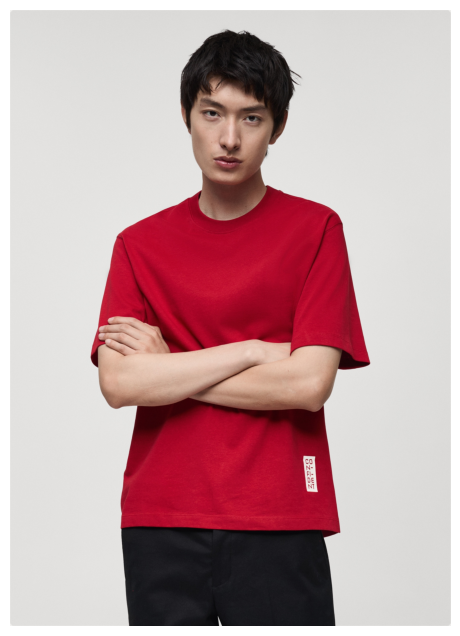

BLIP-2 Prediction1: t-shirt
BLIP-2 Prediction2: Red
BLIP-2 Prediction3: 
Inference time: 0.54 seconds

Analyzing image 2:


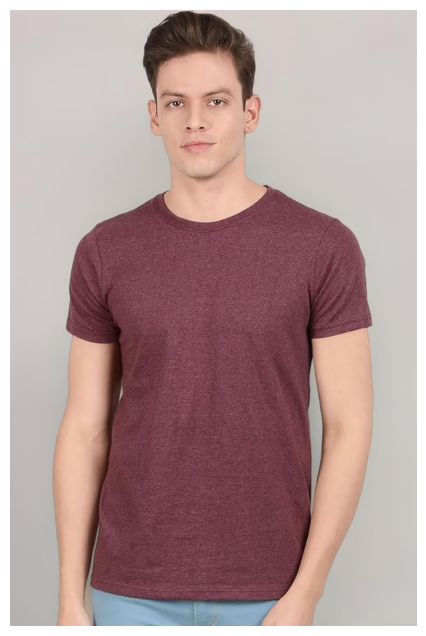

BLIP-2 Prediction1: t-shirt maroon
BLIP-2 Prediction2: maroon
BLIP-2 Prediction3: Solid
Inference time: 0.60 seconds

Analyzing image 3:


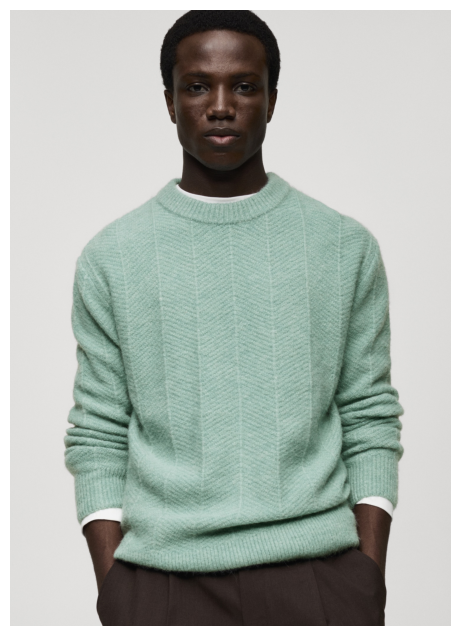

BLIP-2 Prediction1: : sweater
BLIP-2 Prediction2: Mint
BLIP-2 Prediction3: ribbed
Inference time: 0.46 seconds


In [144]:
for idx, image_path in enumerate(test_images):
    print(f"\nAnalyzing image {idx+1}:")
    result = classify_upperwear_open(image_path)
    display_image(result["image"])
    print(f"BLIP-2 Prediction1: {result['prediction1']}")
    print(f"BLIP-2 Prediction2: {result['prediction2']}")
    print(f"BLIP-2 Prediction3: {result['prediction3']}")

    print(f"Inference time: {result['inference_time']:.2f} seconds")

In [117]:
test_images2=["https://as1.ftcdn.net/jpg/01/74/47/66/1000_F_174476658_avv58kJyUM9WN3oNQ3TWJa4AdSFMk48A.jpg","https://m.media-amazon.com/images/I/41KM3+5XsCL._AC_UY350_.jpg"]



Analyzing image 1:


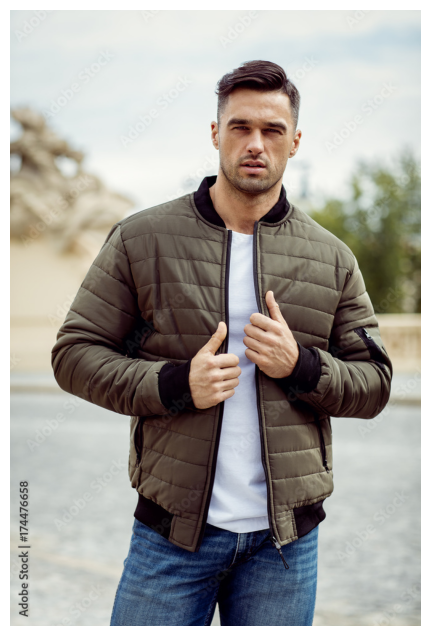

BLIP-2 Prediction1: - bomber jacket
BLIP-2 Prediction2: Green
BLIP-2 Prediction3: The design pattern is a combination of two or more
Inference time: 0.54 seconds

Analyzing image 2:


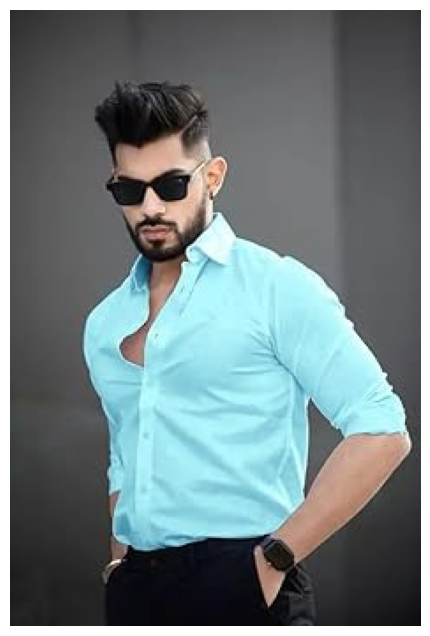

BLIP-2 Prediction1: - casual shirt
BLIP-2 Prediction2: Blue
BLIP-2 Prediction3: Solid
Inference time: 0.51 seconds


In [145]:
for idx, image_path in enumerate(test_images2):
    print(f"\nAnalyzing image {idx+1}:")
    result = classify_upperwear_open(image_path)
    display_image(result["image"])
    print(f"BLIP-2 Prediction1: {result['prediction1']}")
    print(f"BLIP-2 Prediction2: {result['prediction2']}")
    print(f"BLIP-2 Prediction3: {result['prediction3']}")

    print(f"Inference time: {result['inference_time']:.2f} seconds")

In [151]:
test_images3=["https://tigc.in/cdn/shop/files/0424-DPS-85RX-2_1.jpg?v=1732015260","https://assets.ajio.com/medias/sys_master/root/20230912/4QdS/64ff9574afa4cf41f5da8f37/-473Wx593H-466560468-blue-MODEL2.jpg","https://www.beyours.in/cdn/shop/files/rust-orange-hoodie-2.jpg?v=1695619934&width=1024","https://i.etsystatic.com/8891207/r/il/75f652/2636243538/il_570xN.2636243538_6i22.jpg","https://assets.ajio.com/medias/sys_master/root/20231204/pUWI/656df3e1afa4cf41f5b32bd9/-473Wx593H-463765182-blue-MODEL.jpg"]


Analyzing image 1:


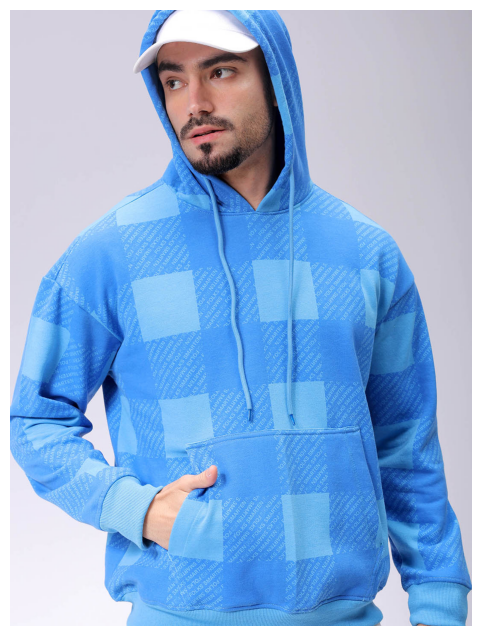

BLIP-2 Prediction1: hoodie
BLIP-2 Prediction2: Blue
BLIP-2 Prediction3: Checker
Inference time: 0.48 seconds

Analyzing image 2:


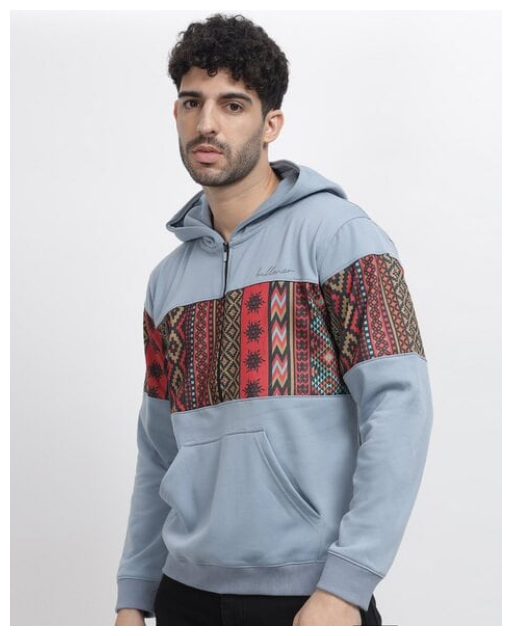

BLIP-2 Prediction1: hoodie blue
BLIP-2 Prediction2: Blue
BLIP-2 Prediction3: Aztec
Inference time: 0.49 seconds

Analyzing image 3:


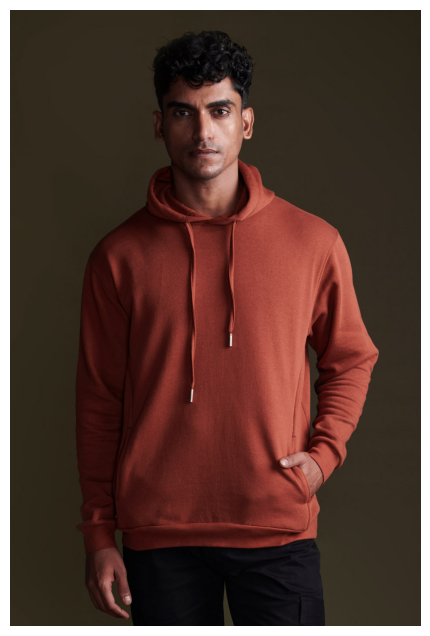

BLIP-2 Prediction1: - hooded sweatshirt
BLIP-2 Prediction2: Red
BLIP-2 Prediction3: 
Inference time: 0.59 seconds

Analyzing image 4:


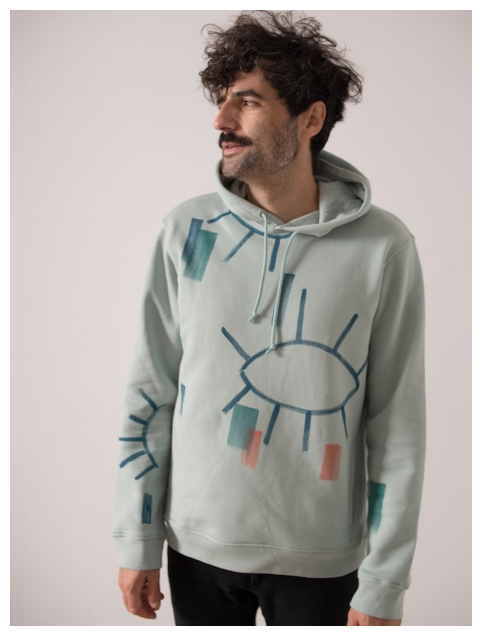

BLIP-2 Prediction1: hoodie - blue
BLIP-2 Prediction2: blue
BLIP-2 Prediction3: The design pattern is a geometric pattern
Inference time: 0.55 seconds

Analyzing image 5:


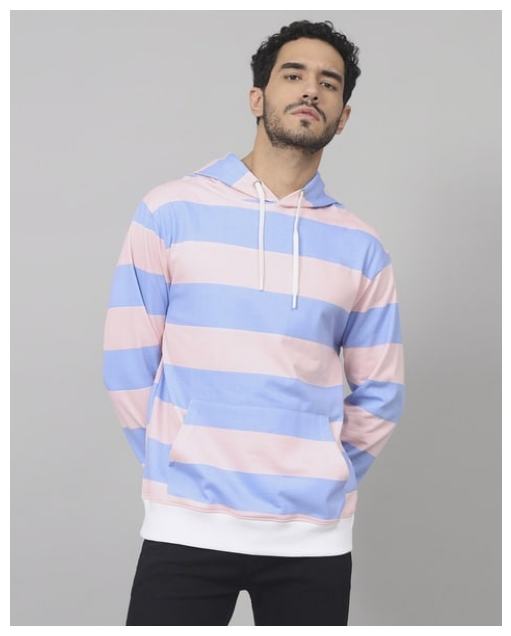

BLIP-2 Prediction1: hooded sweatshirt
BLIP-2 Prediction2: Pink
BLIP-2 Prediction3: Striped hoodie
Inference time: 0.55 seconds


In [152]:
for idx, image_path in enumerate(test_images3):
    print(f"\nAnalyzing image {idx+1}:")
    result = classify_upperwear_open(image_path)
    display_image(result["image"])
    print(f"BLIP-2 Prediction1: {result['prediction1']}")
    print(f"BLIP-2 Prediction2: {result['prediction2']}")
    print(f"BLIP-2 Prediction3: {result['prediction3']}")

    print(f"Inference time: {result['inference_time']:.2f} seconds")

In [111]:
test_images4 = ["https://imagescdn.peterengland.com/img/app/product/6/662943-14534432.jpg?auto=format&w=390", "https://imagescdn.louisphilippe.com/img/app/product/9/902316-11088469.jpg?auto=format&w=390"]


Analyzing image 1:


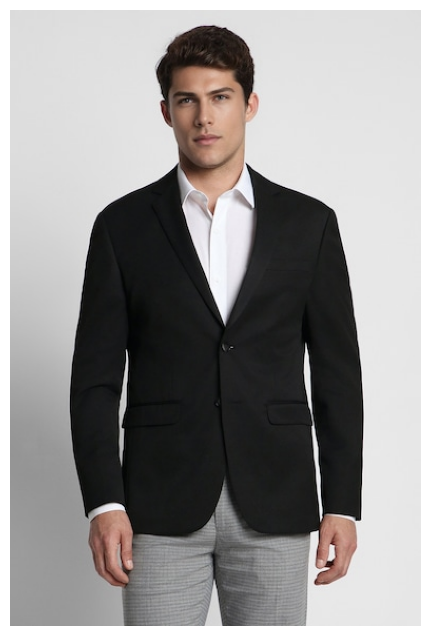

BLIP-2 Prediction1: - blazer - black
BLIP-2 Prediction2: Black
BLIP-2 Prediction3: The pattern is a solid color
Inference time: 0.64 seconds

Analyzing image 2:


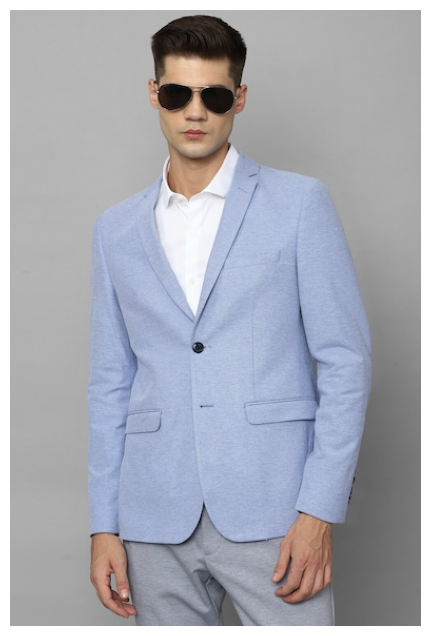

BLIP-2 Prediction1: blue solid blazer
BLIP-2 Prediction2: Blue
BLIP-2 Prediction3: Solid
Inference time: 0.56 seconds


In [153]:
for idx, image_path in enumerate(test_images4):
    print(f"\nAnalyzing image {idx+1}:")
    result = classify_upperwear_open(image_path)
    display_image(result["image"])
    print(f"BLIP-2 Prediction1: {result['prediction1']}")
    print(f"BLIP-2 Prediction2: {result['prediction2']}")
    print(f"BLIP-2 Prediction3: {result['prediction3']}")

    print(f"Inference time: {result['inference_time']:.2f} seconds")

In [16]:
#Sleeve prediction

In [169]:
test_images5 = ["https://media.istockphoto.com/id/1490616219/photo/portrait-of-handsome-young-man.jpg?s=612x612&w=0&k=20&c=09ehr2Z76fj7Ho7j5hXq-G-8lwnmhPC-wRDEJ7FPihw=","https://www.rockit.co.in/cdn/shop/products/2230101584-2-38_1.jpg?v=1703672015","https://image.uniqlo.com/UQ/ST3/in/imagesgoods/457517/item/ingoods_54_457517_3x4.jpg?width=369","https://londonprints.in/cdn/shop/products/859-3.jpg?v=1725264981&width=1445","https://assets.myntassets.com/w_412,q_60,dpr_2,fl_progressive/assets/images/25128936/2023/9/23/8c37302a-c69c-41fa-b348-a5ffc3d313171695445642207HERENOWMenBlackSlimFitOpaquePrintedCasualShirt6.jpg"]


Analyzing image 1:


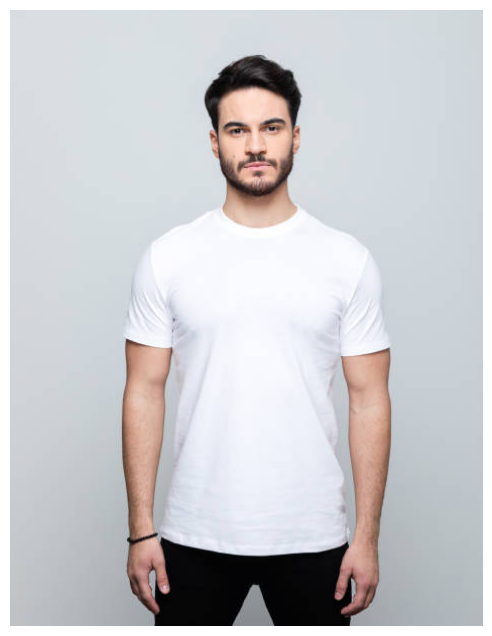

BLIP-2 Prediction1: - cotton t-shirt
BLIP-2 Prediction2: White
BLIP-2 Prediction3: Solid
Inference time: 0.62 seconds

Analyzing image 2:


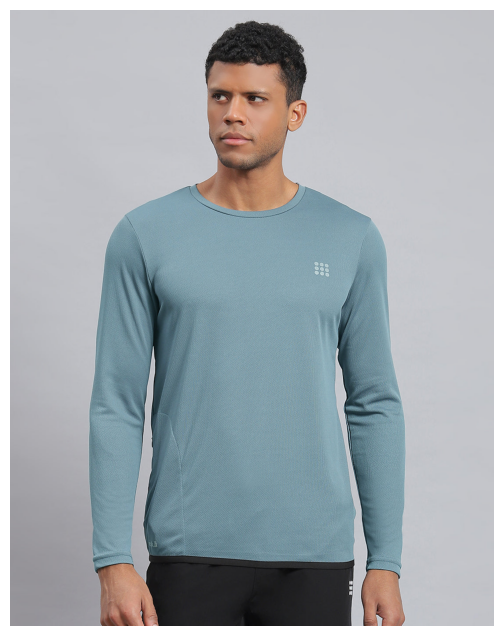

BLIP-2 Prediction1: - long sleeve t-shirt
BLIP-2 Prediction2: Blue
BLIP-2 Prediction3: Solid
Inference time: 0.65 seconds

Analyzing image 3:


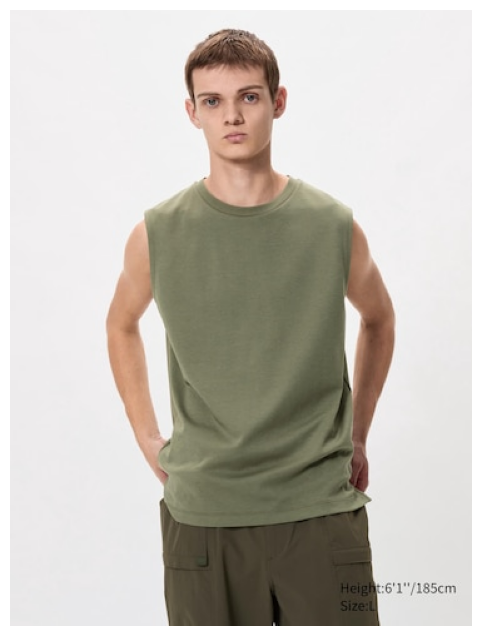

BLIP-2 Prediction1: sleeveless t-shirt
BLIP-2 Prediction2: Green
BLIP-2 Prediction3: 
Inference time: 0.66 seconds

Analyzing image 4:


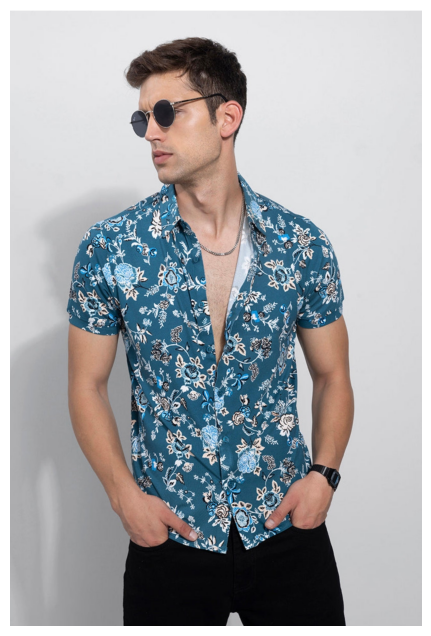

BLIP-2 Prediction1: - shirt
BLIP-2 Prediction2: Blue
BLIP-2 Prediction3: floral
Inference time: 0.47 seconds

Analyzing image 5:


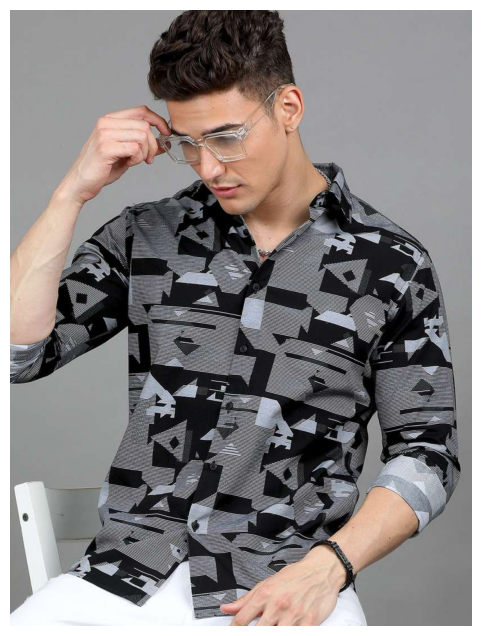

BLIP-2 Prediction1: - black & white printed shirt
BLIP-2 Prediction2: Black
BLIP-2 Prediction3: Black & white geometric print shirt
Inference time: 0.66 seconds


In [170]:
for idx, image_path in enumerate(test_images5):
    print(f"\nAnalyzing image {idx+1}:")
    result = classify_upperwear_open(image_path)
    display_image(result["image"])

    print(f"BLIP-2 Prediction1: {result['prediction1']}")
    print(f"BLIP-2 Prediction2: {result['prediction2']}")
    print(f"BLIP-2 Prediction3: {result['prediction3']}")


    print(f"Inference time: {result['inference_time']:.2f} seconds")

In [157]:
test_images7= ["https://assets.ajio.com/medias/sys_master/root/20231024/p302/6536f351ddf779151954b553/-473Wx593H-466740904-multi-MODEL.jpg","https://images.jdmagicbox.com/quickquotes/images_main/navyas-fashion-green-paisley-cotton-reversible-quilted-jacket-2223004730-u3gg2o9v.jpg"]

In [72]:
#actual jacket purchase link
#https://www.ajio.com/terra-luna-men-paisley-print-regular-fit-zip-front-bomber-jacket/p/466740904_multi


Analyzing image 1:


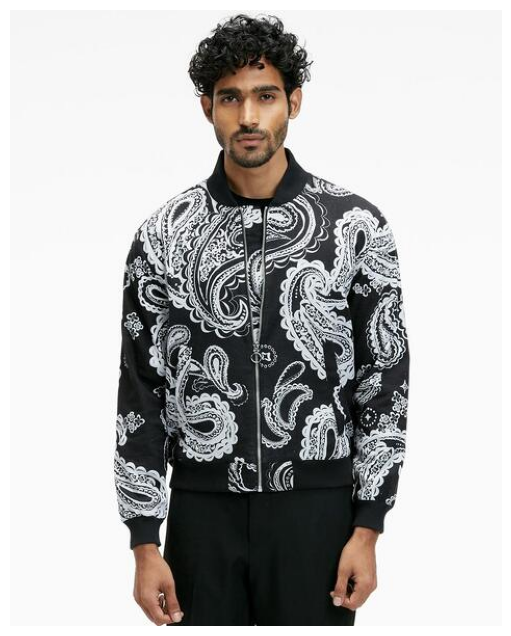

BLIP-2 Prediction1: : bomber jacket
BLIP-2 Prediction2: Black
BLIP-2 Prediction3: paisley
Inference time: 0.54 seconds

Analyzing image 2:


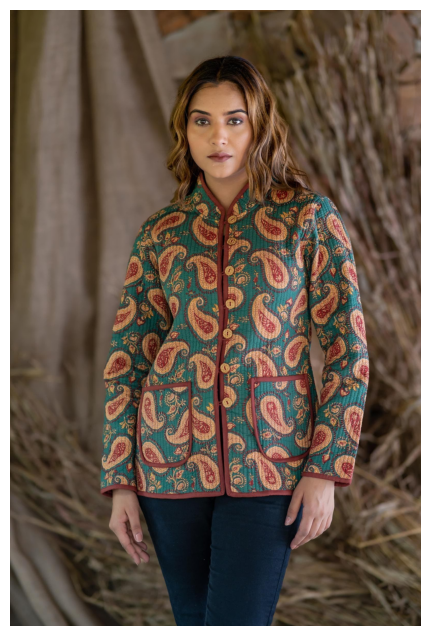

BLIP-2 Prediction1: - jacket - green
BLIP-2 Prediction2: green
BLIP-2 Prediction3: paisley
Inference time: 0.55 seconds


In [158]:
for idx, image_path in enumerate(test_images7):
    print(f"\nAnalyzing image {idx+1}:")
    result = classify_upperwear_open(image_path)
    display_image(result["image"])

    print(f"BLIP-2 Prediction1: {result['prediction1']}")
    print(f"BLIP-2 Prediction2: {result['prediction2']}")
    print(f"BLIP-2 Prediction3: {result['prediction3']}")

    print(f"Inference time: {result['inference_time']:.2f} seconds")

In [159]:
test_images8 = ["https://www.crimsouneclub.com/cdn/shop/products/SW1320.jpg?v=1739967467","https://imagescdn.pantaloons.com/img/app/product/7/785299-9135281.jpg?auto=format&w=450"]


Analyzing image 1:


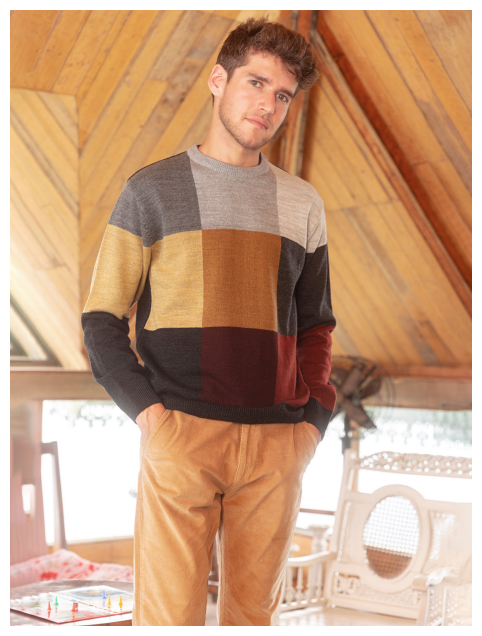

BLIP-2 Prediction_garment: : sweater
BLIP-2 Prediction_colour: Multicoloured
BLIP-2 Prediction_pattern: Color block
Inference time: 0.50 seconds

Analyzing image 2:


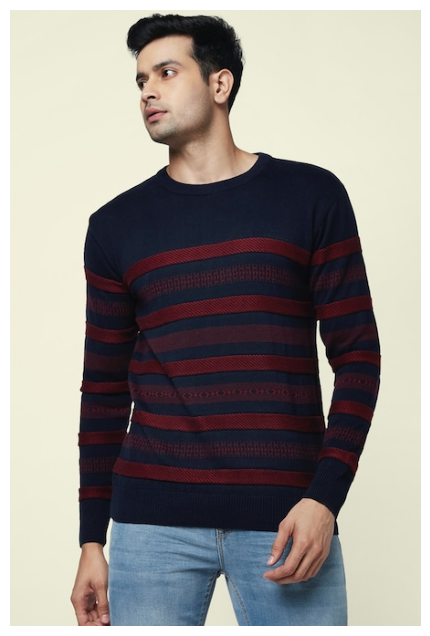

BLIP-2 Prediction_garment: men's striped sweater
BLIP-2 Prediction_colour: Blue
BLIP-2 Prediction_pattern: Striped
Inference time: 0.56 seconds


In [160]:
for idx, image_path in enumerate(test_images8):
    print(f"\nAnalyzing image {idx+1}:")
    result = classify_upperwear_open(image_path)
    display_image(result["image"])

    print(f"BLIP-2 Prediction_garment: {result['prediction1']}")
    print(f"BLIP-2 Prediction_colour: {result['prediction2']}")
    print(f"BLIP-2 Prediction_pattern: {result['prediction3']}")

    print(f"Inference time: {result['inference_time']:.2f} seconds")

In [75]:
test_images9 = ["https://www.montecarlo.in/cdn/shop/files/224067524-2-36_1.jpg?v=1738772153","https://m.media-amazon.com/images/I/51v380UlllL._AC_UY1100_.jpg","https://www.handicraft-palace.com/wp-content/uploads/2020/11/ethnic-wear-women-cotton-beautiful-jacket-reversible-coat-QCJ-29-1.webp","https://assets.myntassets.com/dpr_1.5,q_60,w_400,c_limit,fl_progressive/assets/images/2024/NOVEMBER/28/z7A6QsEe_060ae97289e34c17bb98cc14a2b0053c.jpg"]


Analyzing image 1:


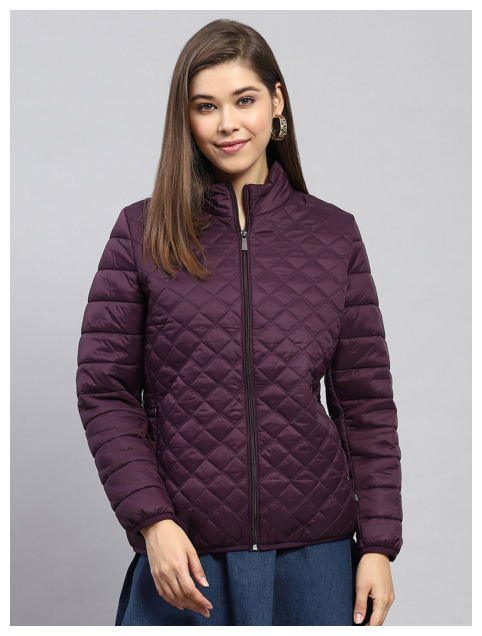

BLIP-2 Prediction_garment: women's quilted jacket
BLIP-2 Prediction_colour: Purple
BLIP-2 Prediction_pattern: Solid
Inference time: 0.67 seconds

Analyzing image 2:


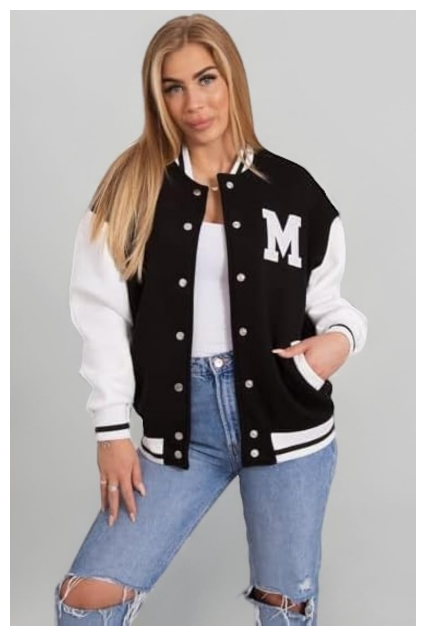

BLIP-2 Prediction_garment: varsity jacket
BLIP-2 Prediction_colour: Black
BLIP-2 Prediction_pattern: Lettering
Inference time: 0.50 seconds

Analyzing image 3:


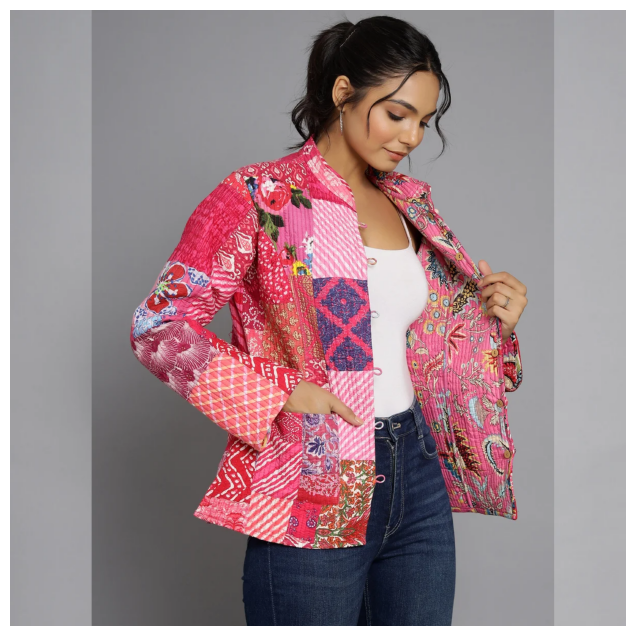

BLIP-2 Prediction_garment: - jacket
BLIP-2 Prediction_colour: Pink
BLIP-2 Prediction_pattern: Patchwork
Inference time: 0.46 seconds

Analyzing image 4:


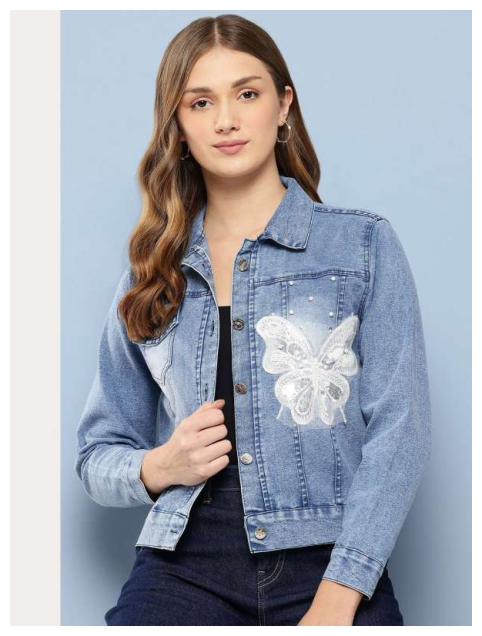

BLIP-2 Prediction_garment: embroidery denim jacket
BLIP-2 Prediction_colour: Blue
BLIP-2 Prediction_pattern: Butterfly
Inference time: 0.61 seconds


In [76]:
for idx, image_path in enumerate(test_images9):
    print(f"\nAnalyzing image {idx+1}:")
    result = classify_upperwear_open(image_path)
    display_image(result["image"])

    print(f"BLIP-2 Prediction_garment: {result['prediction1']}")
    print(f"BLIP-2 Prediction_colour: {result['prediction2']}")
    print(f"BLIP-2 Prediction_pattern: {result['prediction3']}")

    print(f"Inference time: {result['inference_time']:.2f} seconds")

In [87]:
test_images10 = ["https://hashboosh.com/cdn/shop/files/8-2024-02-03T075305.531.jpg?v=1706927256","https://nolabels.in/cdn/shop/files/9_80557a7f-bfe0-43ac-9ff2-efc8d6b85421.jpg?v=1721117589&width=1080"]


Analyzing image 1:


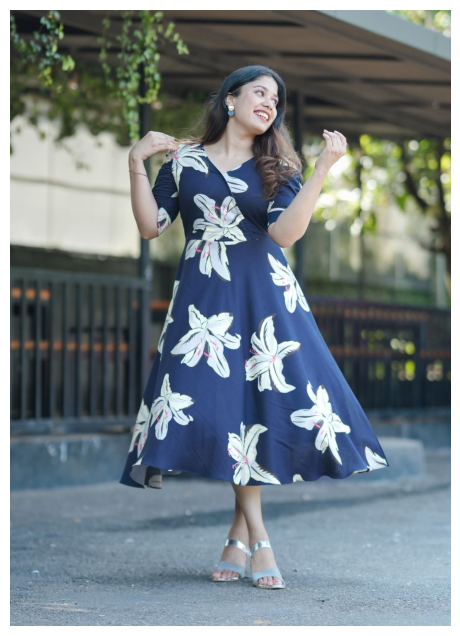

BLIP-2 Prediction_garment: - floral print dress
BLIP-2 Prediction_colour: Blue
BLIP-2 Prediction_pattern: It is a floral print
Inference time: 0.59 seconds

Analyzing image 2:


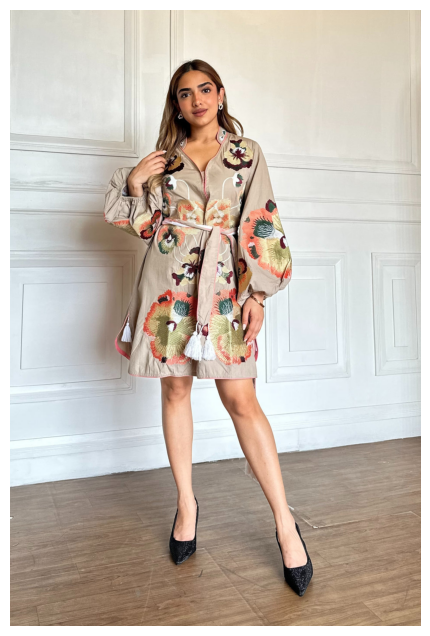

BLIP-2 Prediction_garment: - shirt dress
BLIP-2 Prediction_colour: Beige
BLIP-2 Prediction_pattern: It is a floral pattern
Inference time: 0.50 seconds


In [88]:
for idx, image_path in enumerate(test_images10):
    print(f"\nAnalyzing image {idx+1}:")
    result = classify_upperwear_open(image_path)
    display_image(result["image"])

    print(f"BLIP-2 Prediction_garment: {result['prediction1']}")
    print(f"BLIP-2 Prediction_colour: {result['prediction2']}")
    print(f"BLIP-2 Prediction_pattern: {result['prediction3']}")

    print(f"Inference time: {result['inference_time']:.2f} seconds")